In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import copy
import pickle
import warnings

import numpy as np

from astropy.table import Table, Column

import matplotlib.pyplot as plt

## Making a shorter version of the `objectTable_tract` output catalog

In [2]:
loc = '/Users/song/Downloads/merian_cosmos/'

hsc_bands = ['g', 'r', 'i', 'z', 'y']
merian_bands = ['N708']

In [40]:
col_basic = [
    'index', 'tract', 'patch', 'coord_ra', 'coord_dec', 'footprintArea',
    'shape_xx', 'shape_yy', 'shape_xy', 'shape_flag',
]

In [68]:
phot_col = [
    'ra',
    'decl',
    'inputCount',
    'extendedness',
    'extendedness_flag',
    'blendedness',
    'blendedness_flag',
    'fwhm',
    'calib_astrometry_used',
    'calib_photometry_used',
    'calib_psf_used',
    'centroid_flag',
    'centroid_xErr',
    'centroid_yErr',
    'psfFlux',
    'psfFluxErr',
    'psfFlux_flag',
    'gaapPsfFlux',
    'gaapPsfFluxErr',
    'gaap1p0Flux',
    'gaap1p0FluxErr',
    'gaap1p5Flux',
    'gaap1p5FluxErr',
    'gaap2p5Flux',
    'gaap2p5FluxErr',
    'gaap3p0Flux',
    'gaap3p0FluxErr',
    'gaapOptimalFlux',
    'gaapOptimalFluxErr',
    'gaapFlux_flag',
    'gaapOptimalFlux_flag_bigPsf',
    'gaap1p0Flux_flag_bigPsf',
    'gaap1p5Flux_flag_bigPsf',
    'gaap2p5Flux_flag_bigPsf',
    'gaap3p0Flux_flag_bigPsf',
    'ap12Flux',
    'ap12FluxErr',
    'ap12Flux_flag',
    'ap17Flux',
    'ap17FluxErr',
    'ap17Flux_flag',
    'ap25Flux',
    'ap25FluxErr',
    'ap25Flux_flag',
    'ap35Flux',
    'ap35FluxErr',
    'ap35Flux_flag',
    'ap50Flux',
    'ap50FluxErr',
    'ap50Flux_flag',
    'ap70Flux',
    'ap70FluxErr',
    'ap70Flux_flag',
    'apFlux_flag',
    'cModelFlux',
    'cModelFluxErr',
    'cModelFlux_inner',
    'cModel_flag',
    'pixelFlags_clipped',
    'pixelFlags_clippedCenter',
    'pixelFlags_cr',
    'pixelFlags_crCenter',
    'pixelFlags_edge',
    'pixelFlags_interpolated',
    'pixelFlags_interpolatedCenter',
    'pixelFlags_saturated',
    'pixelFlags_saturatedCenter',
]

### HSC COSMOS catalog

In [70]:
hsc_cos = Table.read(os.path.join(loc, 'hsc_cosmos_202202_primary.fits'))

hsc_cos.add_column(Column(name='index', data=np.arange(len(hsc_cos)) + 1))

for col in col_basic:
    hsc_cos.rename_column(col, 'hsc_' + col)
    
hsc_use = hsc_cos[['hsc_' + col for col in col_basic] + [band + '_' + col for col in phot_col for band in hsc_bands]]

In [71]:
fdfc = ((hsc_use['g_inputCount'] >= 5) & (hsc_use['r_inputCount'] >= 5) & (hsc_use['i_inputCount'] >= 5) & 
        (hsc_use['z_inputCount'] >= 5) & (hsc_use['y_inputCount'] >= 5))

print(fdfc.sum())

1064299


In [73]:
hsc_fdfc = hsc_use[fdfc]

hsc_fdfc.write(os.path.join(loc, 'hsc_cosmos_202202_primary_fdfc_short.fits'), overwrite=True, format='fits') 

### Merian Catalog

#### Wide

In [54]:
n708_wide = Table.read(os.path.join(loc, 'merian_n708_wide_cosmos_202202_primary.fits'))
n708_wide.add_column(Column(name='index', data=np.arange(len(n708_wide)) + 1))

for col in col_basic:
    n708_wide.rename_column(col, 'merian_' + col)
    
n708_wide_use = n708_wide[['merian_' + col for col in col_basic] + [band + '_' + col for col in phot_col for band in merian_bands]]

n708_wide_use.write(os.path.join(loc, 'merian_n708_wide_cosmos_202202_primary_short.fits'), overwrite=True, format='fits') 

#### Deep

In [55]:
n708_deep = Table.read(os.path.join(loc, 'merian_n708_deep_cosmos_202202_primary.fits'))
n708_deep.add_column(Column(name='index', data=np.arange(len(n708_deep)) + 1))

for col in col_basic:
    n708_deep.rename_column(col, 'merian_' + col)
    
n708_deep_use = n708_deep[['merian_' + col for col in col_basic] + [band + '_' + col for col in phot_col for band in merian_bands]]

n708_deep_use.write(os.path.join(loc, 'merian_n708_deep_cosmos_202202_primary_short.fits'), overwrite=True, format='fits') 

#### Best

In [56]:
n708_best = Table.read(os.path.join(loc, 'merian_n708_best_cosmos_202202_primary.fits'))
n708_best.add_column(Column(name='index', data=np.arange(len(n708_best)) + 1))

for col in col_basic:
    n708_best.rename_column(col, 'merian_' + col)
    
n708_best_use = n708_best[['merian_' + col for col in col_basic] + [band + '_' + col for col in phot_col for band in merian_bands]]

n708_best_use.write(os.path.join(loc, 'merian_n708_best_cosmos_202202_primary_short.fits'), overwrite=True, format='fits') 

#### Check the overlap

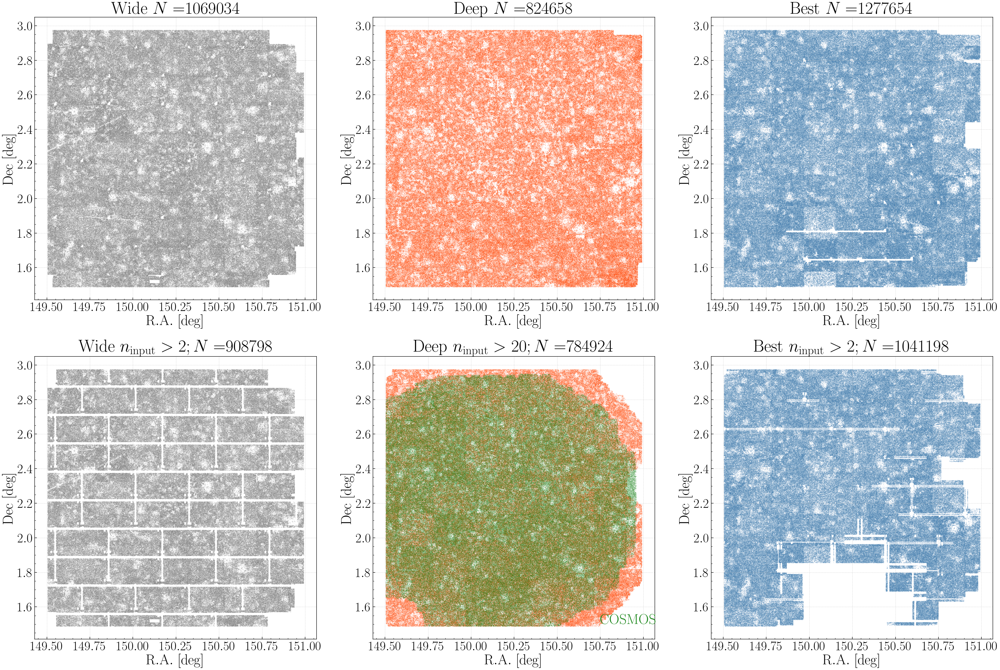

In [111]:
fig_mosaic = """
ABC
DEF
"""

fig, axes = plt.subplot_mosaic(mosaic=fig_mosaic, figsize=(60, 40))

axes["A"].scatter(n708_wide['merian_coord_ra'], n708_wide['merian_coord_dec'], s=1, alpha=0.15, color='grey')
axes["A"].set_title(r"${\rm Wide}\ N=$" + r"${:d}$".format(len(n708_wide)), fontsize=60)
axes["A"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["A"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["A"].tick_params(axis='both', which='major', labelsize=45)

axes["B"].scatter(n708_deep['merian_coord_ra'], n708_deep['merian_coord_dec'], s=1, alpha=0.15, color='orangered')
axes["B"].set_title(r"${\rm Deep}\ N=$" + r"${:d}$".format(len(n708_deep)), fontsize=60)
axes["B"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["B"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["B"].tick_params(axis='both', which='major', labelsize=45)

axes["C"].scatter(n708_best['merian_coord_ra'], n708_best['merian_coord_dec'], s=1, alpha=0.15, color='steelblue')
axes["C"].set_title(r"${\rm Best}\ N=$" + r"${:d}$".format(len(n708_best)), fontsize=60)
axes["C"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["C"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["C"].tick_params(axis='both', which='major', labelsize=45)

mask = n708_wide['N708_inputCount'] > 2
axes["D"].scatter(n708_wide['merian_coord_ra'][mask], n708_wide['merian_coord_dec'][mask], s=1, alpha=0.15, color='grey')
axes["D"].set_title(r"${\rm Wide}\ n_{\rm input}>2; N=$" + r"${:d}$".format(len(n708_wide[mask])), fontsize=60)
axes["D"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["D"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["D"].tick_params(axis='both', which='major', labelsize=45)

mask = n708_deep['N708_inputCount'] > 20
axes["E"].scatter(n708_deep['merian_coord_ra'][mask], n708_deep['merian_coord_dec'][mask], s=1, alpha=0.15, color='orangered')
axes["E"].scatter(hsc_use['g_ra'][fdfc], hsc_use['g_decl'][fdfc], s=1, alpha=0.1, color='forestgreen')
axes["E"].set_title(r"${\rm Deep}\ n_{\rm input}>20; N=$" + r"${:d}$".format(len(n708_deep[mask])), fontsize=60)
axes["E"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["E"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["E"].tick_params(axis='both', which='major', labelsize=45)
axes["E"].text(150.75, 1.5, r"$\rm COSMOS$", color="forestgreen", fontsize=50)

mask = n708_best['N708_inputCount'] > 2
axes["F"].scatter(n708_best['merian_coord_ra'][mask], n708_best['merian_coord_dec'][mask], s=1, alpha=0.15, color='steelblue')
axes["F"].set_title(r"${\rm Best}\ n_{\rm input}>2; N=$" + r"${:d}$".format(len(n708_best[mask])), fontsize=60)
axes["F"].set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
axes["F"].set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
axes["F"].tick_params(axis='both', which='major', labelsize=45)


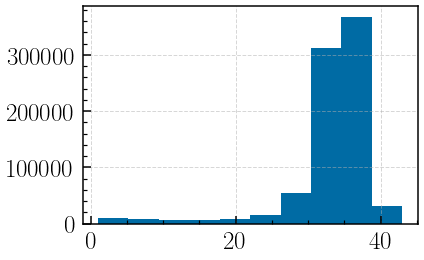

In [91]:
#_ = plt.hist(n708_wide['N708_inputCount'])
_ = plt.hist(n708_deep['N708_inputCount'])
#_ = plt.hist(n708_best['N708_inputCount'])

In [138]:
wide_cen_mask = np.hypot((n708_wide['merian_coord_ra'] - 150.2), (n708_wide['merian_coord_dec'] - 2.21)) <= 0.71
deep_cen_mask = np.hypot((n708_deep['merian_coord_ra'] - 150.2), (n708_deep['merian_coord_dec'] - 2.21)) <= 0.71

cosmos_cen_mask = np.hypot((hsc_use['i_ra'] - 150.2), (hsc_use['i_decl'] - 2.21)) <= 0.71

n708_wide_cen = n708_wide_use[wide_cen_mask]
n708_deep_cen = n708_deep_use[deep_cen_mask]

hsc_cen = hsc_use[cosmos_cen_mask & fdfc]

In [139]:
hsc_cen.write(os.path.join(loc, 'hsc_cosmos_202202_primary_cen.fits'), overwrite=True)

n708_wide_cen.write(os.path.join(loc, 'merian_n708_wide_cosmos_202202_primary_cen.fits'), overwrite=True)
n708_deep_cen.write(os.path.join(loc, 'merian_n708_deep_cosmos_202202_primary_cen.fits'), overwrite=True)

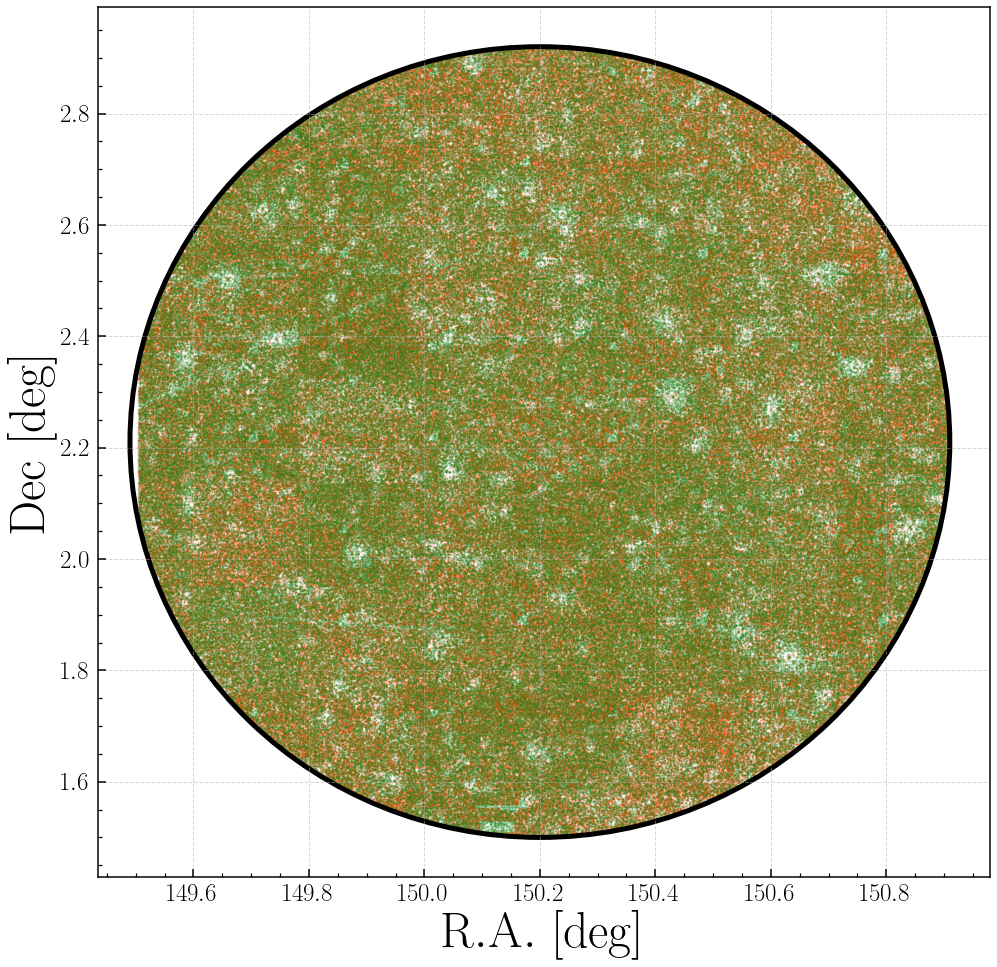

In [135]:
cosmos_circle = plt.Circle((150.2, 2.21), 0.71, fill=False, linewidth=5)
 
mask = n708_deep['N708_inputCount'] > 20
fig = plt.figure(figsize=(16, 16))
ax = fig.add_subplot(111)

ax.scatter(n708_wide['merian_coord_ra'][wide_cen_mask], n708_wide['merian_coord_dec'][wide_cen_mask], s=1, alpha=0.15, color='orangered')
ax.scatter(hsc_use['g_ra'][cosmos_cen_mask], hsc_use['g_decl'][cosmos_cen_mask], s=1, alpha=0.1, color='forestgreen')
ax.set_xlabel(r"$\rm R.A.\ [deg]$", fontsize=50)
ax.set_ylabel(r"$\rm Dec\ [deg]$", fontsize=50)
ax.add_artist(cosmos_circle)

In [162]:
hsc_points = hsc_use[fdfc & (hsc_use['i_extendedness'] < 1) & ~hsc_use['i_extendedness_flag'] & (hsc_use['r_extendedness'] < 1) & ~hsc_use['r_extendedness_flag'] & 
                     ~hsc_use['g_pixelFlags_saturated'] & ~hsc_use['r_pixelFlags_saturated'] & ~hsc_use['i_pixelFlags_saturated'] & 
                     ~hsc_use['z_pixelFlags_saturated'] &
                     ~hsc_use['g_pixelFlags_interpolatedCenter'] & ~hsc_use['r_pixelFlags_interpolatedCenter'] & ~hsc_use['i_pixelFlags_interpolatedCenter'] & 
                     ~hsc_use['z_pixelFlags_interpolatedCenter']
                    ]

In [165]:
hsc_points.write(os.path.join(loc, 'hsc_cosmos_202202_primary_pts.fits'), overwrite=True)